In [1]:
import os, math, pickle
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import MiniBatchKMeans
from sklearn.feature_selection import mutual_info_regression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from sklearn.metrics import mean_squared_error, root_mean_squared_error
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, optimizers
#from keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.layers import LSTM
from keras.layers import Dense
import warnings
warnings.filterwarnings("ignore")
from datetime import datetime, timedelta
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

In [3]:
with open(r'D:\py\train.pkl', 'rb') as trn:
    trnData = pickle.load(trn)

In [205]:
with open(r'D:\py\test.pkl', 'rb') as tst:
    tstData = pickle.load(tst)

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [5]:
trnData.head()

,code,date,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,y
4456454,s_4692,0,-0.702830,0.037067,1.942280,0.801096,-0.006199,0.533025,0.0,0.897703,2.565819,0.943543,-0.041699,1.123725,0.955936,-0.047794,0.026908,-0.002266,0.057543,-5.381960e-05,0.080891,0.006540,0.131208
4307494,s_2993,0,-0.806224,-0.000083,1.380909,0.772071,-0.016396,0.469204,0.0,0.926102,2.576960,0.925218,-0.028462,0.840703,0.883616,-0.034758,-0.002518,-0.044532,0.006992,1.206800e-05,0.013970,0.002926,0.127212
4335761,s_3541,0,-1.505593,0.012782,1.286695,0.823303,-0.145311,0.239580,0.0,0.822199,2.927710,0.921083,0.010997,1.140557,0.874939,-0.073057,0.011109,0.005666,-0.024396,2.397720e-05,0.033982,-0.003505,0.003701
4380664,s_4189,0,-0.253071,0.011285,2.323603,0.884484,0.055950,0.492526,0.0,1.098327,2.595145,0.936513,0.046809,1.268574,1.087053,-0.073244,0.034283,0.002929,0.021058,-3.387910e-05,-0.007128,0.084860,-0.063719
4611516,s_1155,0,-1.570486,-0.011454,2.127275,0.747357,-0.124798,0.316993,0.0,0.927854,2.710364,0.938786,0.048799,1.041251,0.965608,-0.124693,0.004024,-0.057048,-0.010665,8.205000e-07,0.049440,-0.026340,-0.139798


In [6]:
trnData.shape

(2431658, 23)

In [99]:
df = trnData.copy()

In [100]:
df.head()

,code,date,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,y
4456454,s_4692,0,-0.702830,0.037067,1.942280,0.801096,-0.006199,0.533025,0.0,0.897703,2.565819,0.943543,-0.041699,1.123725,0.955936,-0.047794,0.026908,-0.002266,0.057543,-5.381960e-05,0.080891,0.006540,0.131208
4307494,s_2993,0,-0.806224,-0.000083,1.380909,0.772071,-0.016396,0.469204,0.0,0.926102,2.576960,0.925218,-0.028462,0.840703,0.883616,-0.034758,-0.002518,-0.044532,0.006992,1.206800e-05,0.013970,0.002926,0.127212
4335761,s_3541,0,-1.505593,0.012782,1.286695,0.823303,-0.145311,0.239580,0.0,0.822199,2.927710,0.921083,0.010997,1.140557,0.874939,-0.073057,0.011109,0.005666,-0.024396,2.397720e-05,0.033982,-0.003505,0.003701
4380664,s_4189,0,-0.253071,0.011285,2.323603,0.884484,0.055950,0.492526,0.0,1.098327,2.595145,0.936513,0.046809,1.268574,1.087053,-0.073244,0.034283,0.002929,0.021058,-3.387910e-05,-0.007128,0.084860,-0.063719
4611516,s_1155,0,-1.570486,-0.011454,2.127275,0.747357,-0.124798,0.316993,0.0,0.927854,2.710364,0.938786,0.048799,1.041251,0.965608,-0.124693,0.004024,-0.057048,-0.010665,8.205000e-07,0.049440,-0.026340,-0.139798


In [10]:
"""def numbers_to_days(start_date_str, numbers):
    start_date = datetime.strptime(start_date_str, "%Y-%m-%d")
    datetimes = []
    # The number 1 corresponds to the start date (0 day offset)
    for num in numbers:
        offset = timedelta(days=num)
        datetimes.append(start_date + offset)
    return datetimes
    """

In [11]:
#number_list = range(0, df['date'].max())


In [12]:
#date_results = numbers_to_days("2024-01-01", number_list)

In [101]:
df['date'] = pd.to_datetime(df['date'], unit='D', origin='2024-01-01')

In [81]:
#df_d['date'].max().where(df_d['code'] == 's_0')
#df_d.where(df_d['code'] == 's_0').max()
#df_d.where(df_d['code'] == 's_0').sort_values(by='date', ascending=False)

In [94]:
#df_d['date'] = pd.to_datetime(df_d['date'])

In [39]:
#df['date'] = numbers_to_days("2024-01-01", df['date'])

In [102]:
df = df.sort_values(["code", "date"]).reset_index(drop=True)

In [103]:
df.head()

,code,date,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,y
0,s_0,2024-05-01,0.394700,-0.063500,7.562500,0.0,0.048135,0.582772,0.0,1.952015,0.0,0.933833,0.0,0.0,1.452481,0.000000,0.000000,0.000000,0.130791,0.000070,-0.009330,0.0,-0.046793
1,s_0,2024-05-02,0.302114,-0.039620,7.562500,0.0,0.003498,0.571028,0.0,1.718900,0.0,0.921778,0.0,0.0,1.322955,0.000000,0.000000,0.007457,0.132136,0.000037,-0.000959,0.0,-0.001007
2,s_0,2024-05-03,0.210442,-0.021979,7.562500,0.0,-0.035704,0.566825,0.0,1.529921,0.0,0.915979,0.0,0.0,1.203602,0.000000,0.000000,0.017134,0.121744,0.000026,0.024070,0.0,0.057230
3,s_0,2024-05-04,0.091796,-0.014817,7.562500,0.0,-0.073599,0.562066,0.0,1.483651,0.0,0.919647,0.0,0.0,1.197761,0.000000,0.000000,0.030256,0.115516,-0.000006,0.030045,0.0,-0.018251
4,s_0,2024-05-05,-0.000065,-0.010519,9.651191,0.0,-0.105692,0.548534,0.0,1.482967,0.0,0.921448,0.0,0.0,1.224910,-0.017885,-0.032768,0.040731,0.103038,-0.000039,0.023343,0.0,-0.038166


In [44]:
#df['date'] = pd.to_datetime(df['date'])
df = df.sort_values(["code", "date"]).reset_index(drop=True)

In [104]:
# Encode series id
df["code_id"] = df["code"].astype("category").cat.codes.astype(np.int32)

In [105]:
df['t_idx'] = df.groupby('code').cumcount().astype(np.int32)

In [106]:
df.head()

,code,date,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,y,code_id,t_idx
0,s_0,2024-05-01,0.394700,-0.063500,7.562500,0.0,0.048135,0.582772,0.0,1.952015,0.0,0.933833,0.0,0.0,1.452481,0.000000,0.000000,0.000000,0.130791,0.000070,-0.009330,0.0,-0.046793,0,0
1,s_0,2024-05-02,0.302114,-0.039620,7.562500,0.0,0.003498,0.571028,0.0,1.718900,0.0,0.921778,0.0,0.0,1.322955,0.000000,0.000000,0.007457,0.132136,0.000037,-0.000959,0.0,-0.001007,0,1
2,s_0,2024-05-03,0.210442,-0.021979,7.562500,0.0,-0.035704,0.566825,0.0,1.529921,0.0,0.915979,0.0,0.0,1.203602,0.000000,0.000000,0.017134,0.121744,0.000026,0.024070,0.0,0.057230,0,2
3,s_0,2024-05-04,0.091796,-0.014817,7.562500,0.0,-0.073599,0.562066,0.0,1.483651,0.0,0.919647,0.0,0.0,1.197761,0.000000,0.000000,0.030256,0.115516,-0.000006,0.030045,0.0,-0.018251,0,3
4,s_0,2024-05-05,-0.000065,-0.010519,9.651191,0.0,-0.105692,0.548534,0.0,1.482967,0.0,0.921448,0.0,0.0,1.224910,-0.017885,-0.032768,0.040731,0.103038,-0.000039,0.023343,0.0,-0.038166,0,4


In [18]:
dfs0 = df[df['code']=='s_0']

In [19]:
dfs0.shape

(429, 24)

In [20]:
results0 = seasonal_decompose(dfs0['y'], model='additive', period=30)

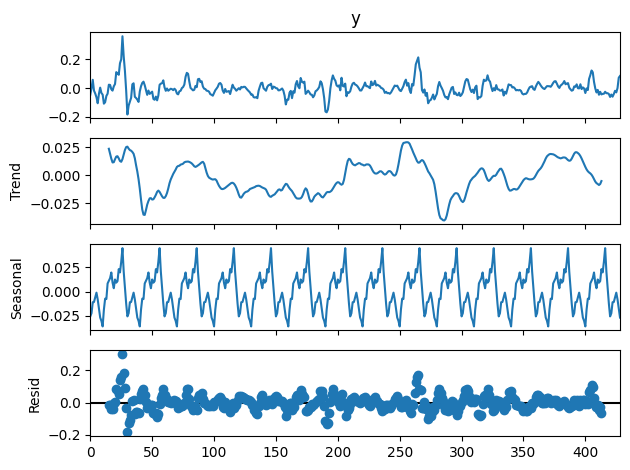

In [21]:
results0.plot()
plt.show()

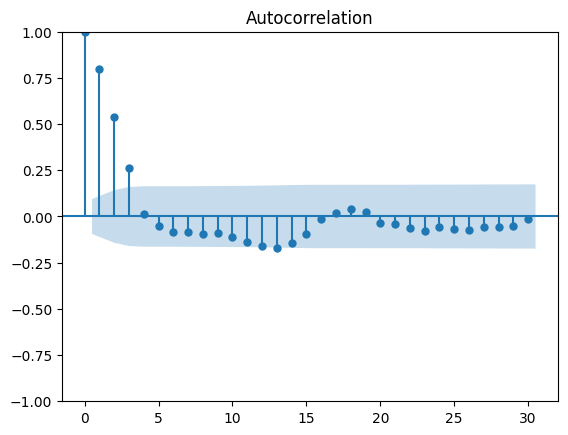

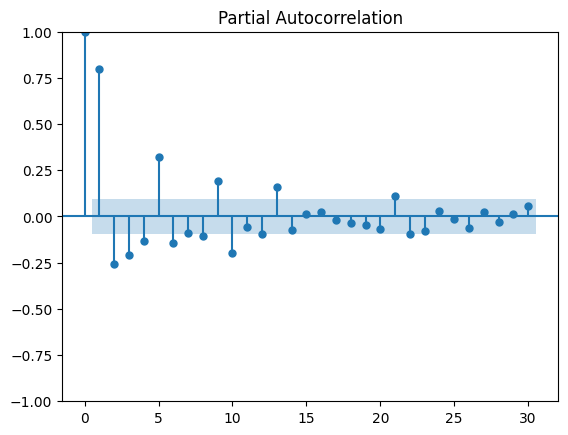

In [43]:
acf_org = plot_acf(dfs0['y'],lags=30)
acf_org = plot_pacf(dfs0['y'],lags=30)

In [23]:
adf_test = adfuller(dfs0['y'])
print(f'p-value : {adf_test[1]}')

p-value : (np.float64(-5.988876689518397), np.float64(1.7651073494359978e-07), 13, 415, {'1%': np.float64(-3.446205926287236), '5%': np.float64(-2.8685297226414734), '10%': np.float64(-2.570493298011322)}, np.float64(-1843.160032652444))


In [ ]:
#stat, p, _, _, _, _ = f.adf_test(full_res=True)

In [86]:
#sns.set(rc={'figure.figsize':(24,8)})
#ax=sns.lineplot(data=df,x='date',y='y',hue='code')
#ax.axes.set_title("\nPlot\n",fontsize=20);

In [25]:
result = seasonal_decompose(df['y'], model='additive', period=12)

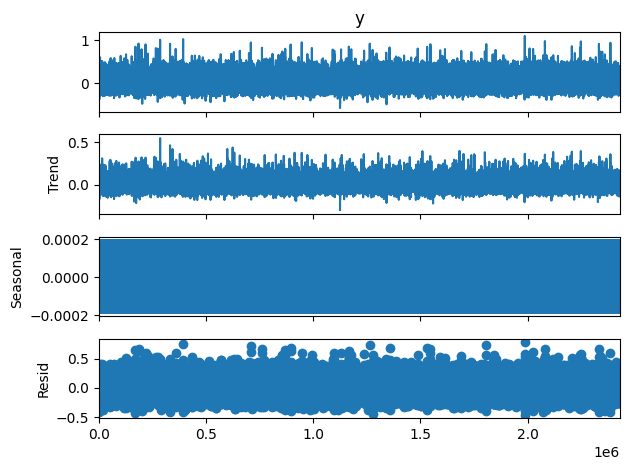

In [26]:
result.plot()
plt.show()

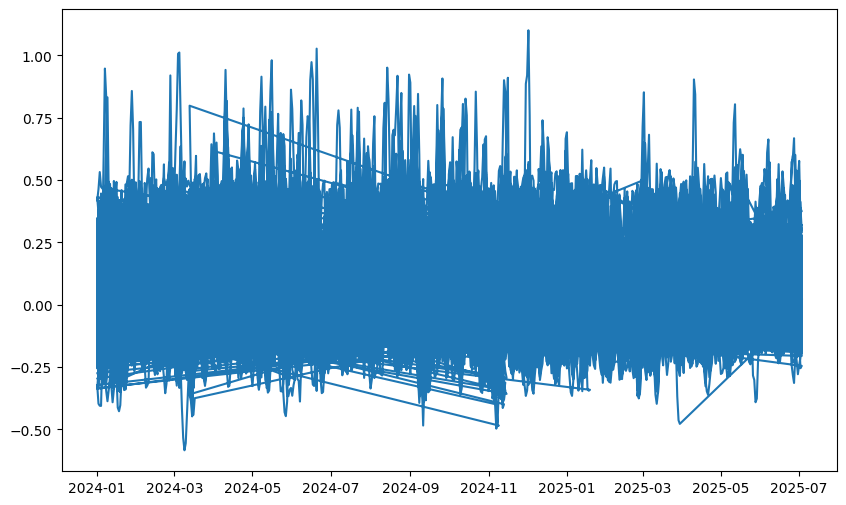

In [27]:
plt.figure(figsize=(10,6))
plt.plot(df['date'], df['y'], label='y')
plt.show()
#codes = df['code']
#for codes in df['code']:
#    plt.plot(df[df['code'] == codes]['y'])
#plt.plot(df[df['code'] == 's_0']['y'])

In [28]:
df.head()

,code,date,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,y,code_id
0,s_0,2024-05-01,0.394700,-0.063500,7.562500,0.0,0.048135,0.582772,0.0,1.952015,0.0,0.933833,0.0,0.0,1.452481,0.000000,0.000000,0.000000,0.130791,0.000070,-0.009330,0.0,-0.046793,0
1,s_0,2024-05-02,0.302114,-0.039620,7.562500,0.0,0.003498,0.571028,0.0,1.718900,0.0,0.921778,0.0,0.0,1.322955,0.000000,0.000000,0.007457,0.132136,0.000037,-0.000959,0.0,-0.001007,0
2,s_0,2024-05-03,0.210442,-0.021979,7.562500,0.0,-0.035704,0.566825,0.0,1.529921,0.0,0.915979,0.0,0.0,1.203602,0.000000,0.000000,0.017134,0.121744,0.000026,0.024070,0.0,0.057230,0
3,s_0,2024-05-04,0.091796,-0.014817,7.562500,0.0,-0.073599,0.562066,0.0,1.483651,0.0,0.919647,0.0,0.0,1.197761,0.000000,0.000000,0.030256,0.115516,-0.000006,0.030045,0.0,-0.018251,0
4,s_0,2024-05-05,-0.000065,-0.010519,9.651191,0.0,-0.105692,0.548534,0.0,1.482967,0.0,0.921448,0.0,0.0,1.224910,-0.017885,-0.032768,0.040731,0.103038,-0.000039,0.023343,0.0,-0.038166,0


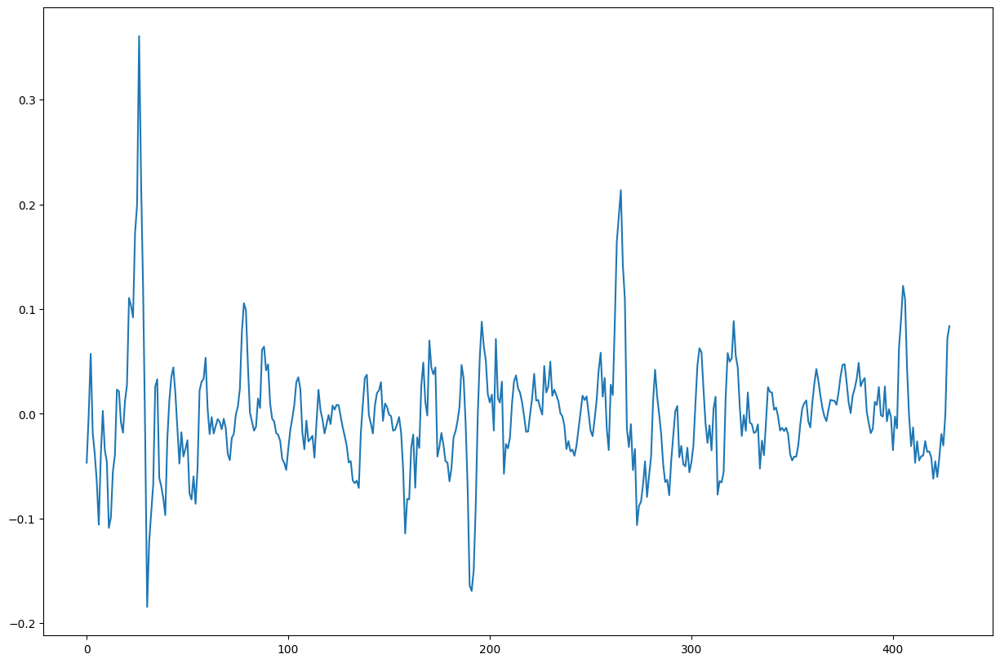

In [29]:
plt.figure(figsize=(15,10))
#codes = df['code']
#for codes in df['code']:
#    plt.plot(df[df['code'] == codes]['y'])
plt.plot(df[df['code'] == 's_0']['y'])

In [110]:
#acf_org = plot_acf(df)
#acf_org = plot_pacf(df)

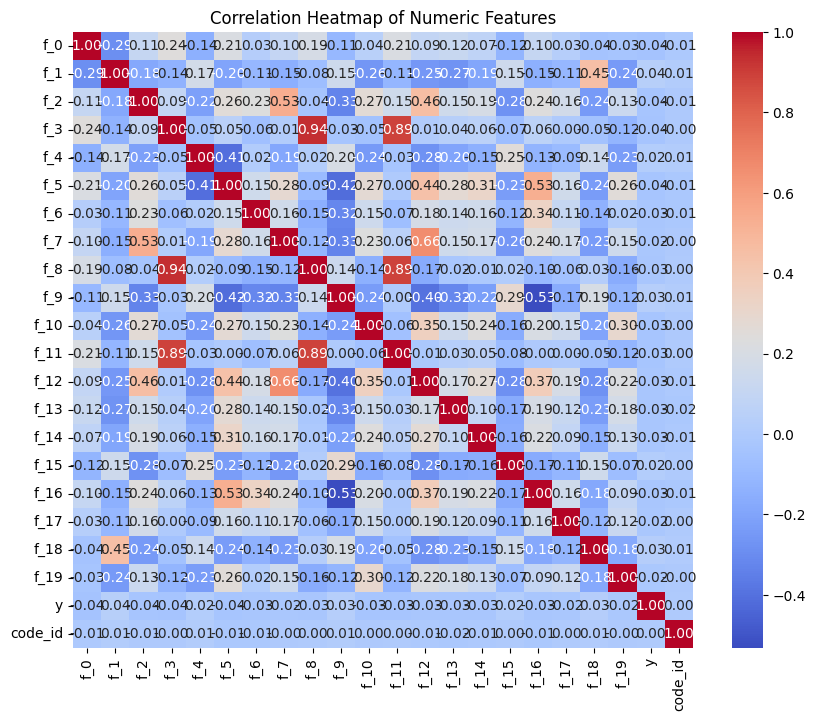

In [13]:
plt.figure(figsize=(10, 8))
numeric_df = df.select_dtypes(include=[np.number]) # df[df['Department'] == 'Marketing']
#corr = numeric_df.groupby("code").corr()
corr = numeric_df.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numeric Features')
plt.show()

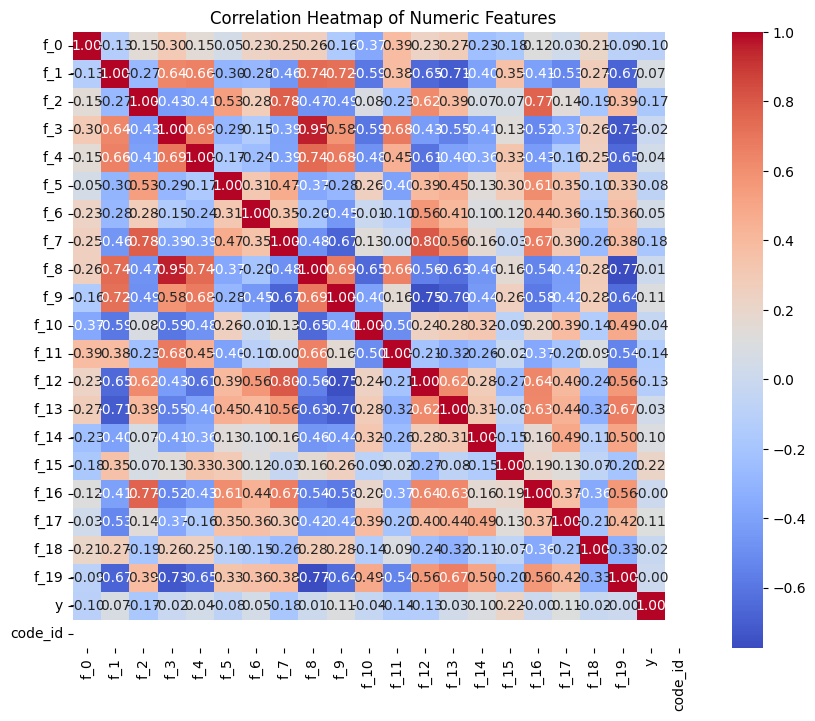

In [14]:
#for c in df['code']:
plt.figure(figsize=(10, 8))
numeric_df = df[df['code'] == 's_0'].select_dtypes(include=[np.number]) # df[df['Department'] == 'Marketing']
#corr = numeric_df.groupby("code").corr()
corr = numeric_df.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numeric Features')
plt.show()

In [ ]:
corr_threshold = 0.7
for cdi in df['code']:    
    numeric_df = df[df['code'] == cdi].select_dtypes(include=[np.number])
    corr = numeric_df.corr()
    filtered_matrix = corr[((corr >= corr_threshold) | (corr <= -corr_threshold)) & (corr != 1.000)].drop
    print(f"\n :", filtered_matrix)


 : <bound method DataFrame.drop of          f_0       f_1       f_2       f_3       f_4  f_5  f_6       f_7  \
f_0      NaN       NaN       NaN       NaN       NaN  NaN  NaN       NaN   
f_1      NaN       NaN       NaN       NaN       NaN  NaN  NaN       NaN   
f_2      NaN       NaN       NaN       NaN       NaN  NaN  NaN  0.780520   
f_3      NaN       NaN       NaN       NaN       NaN  NaN  NaN       NaN   
f_4      NaN       NaN       NaN       NaN       NaN  NaN  NaN       NaN   
f_5      NaN       NaN       NaN       NaN       NaN  NaN  NaN       NaN   
f_6      NaN       NaN       NaN       NaN       NaN  NaN  NaN       NaN   
f_7      NaN       NaN  0.780520       NaN       NaN  NaN  NaN       NaN   
f_8      NaN  0.742053       NaN  0.953164  0.741788  NaN  NaN       NaN   
f_9      NaN  0.718271       NaN       NaN       NaN  NaN  NaN       NaN   
f_10     NaN       NaN       NaN       NaN       NaN  NaN  NaN       NaN   
f_11     NaN       NaN       NaN       NaN       NaN

In [74]:
feature_cols = [c for c in df.columns if c.startswith("f_")]

In [85]:
feature_cols

['f_0',
 'f_1',
 'f_2',
 'f_3',
 'f_4',
 'f_5',
 'f_6',
 'f_7',
 'f_8',
 'f_9',
 'f_10',
 'f_11',
 'f_12',
 'f_13',
 'f_14',
 'f_15',
 'f_16',
 'f_17',
 'f_18',
 'f_19']

In [107]:
sample = df.loc[:, feature_cols + ["y"]].sample(
    n=min(250_000, df.shape[0]), random_state=42
)

In [108]:
corrs = sample[feature_cols].corrwith(sample["y"]).abs().sort_values(ascending=False)
sel_ft = corrs.head(12).index.tolist()
print("Selected f_* features:", sel_ft)

Selected f_* features: ['f_0', 'f_1', 'f_3', 'f_2', 'f_10', 'f_5', 'f_11', 'f_14', 'f_12', 'f_9', 'f_18', 'f_6']


In [360]:
def features_def(df: pd.DataFrame, daily_means=None):
    df = df.copy()
    df["dow"] = df["date"].dt.dayofweek.astype(np.int16)
    df["dom"] = df["date"].dt.day.astype(np.int16)
    df["month"] = df["date"].dt.month.astype(np.int16)
    df["weekofyear"] = df["date"].dt.isocalendar().week.astype(np.int16)
    df["year"] = df["date"].dt.year.astype(np.int16)

    #df["date"] = df["date"].astype('int64').astype('int16')
#    df["code"] = df["code"].astype("category")
    df[feature_cols] = df[feature_cols].astype(np.float32)

    df = df.sort_values(["code", "date"], kind="mergesort").reset_index(drop=True)
    Xf = df[feature_cols].to_numpy(dtype=np.float32)
    df["f_mean"]  = Xf.mean(axis=1)
    df["f_std"]   = Xf.std(axis=1)
    df["f_min"]   = Xf.min(axis=1)
    df["f_max"]   = Xf.max(axis=1)
    df["f_range"] = (df["f_max"] - df["f_min"]).astype(np.float32)

    df_dt= df["date"].copy()
    df_dt["date"] = df["date"].astype('int64').astype('int16')
    d = df_dt["date"].to_numpy()
    PERIODS = [7, 30, 90, 365]
    for p in PERIODS:
        df[f"date_sin_{p}"]  = np.sin(2 * np.pi * d / p).astype(np.float32)
        df[f"date_cos_{p}"]  = np.cos(2 * np.pi * d / p).astype(np.float32)
        
    df["y"] = df["y"].astype(np.float32)
    g = df.groupby("code", observed=True, sort=False)["y"]

    df["y_lag1"] = g.shift(1)
    df["y_lag2"] = g.shift(2)
    df["y_lag3"] = g.shift(3)
    df["y_lag5"] = g.shift(5)

    y_shift1 = g.shift(1)
    df["y_roll_mean_5"] = (
        y_shift1.groupby(df["code"], observed=True, sort=False)
        .rolling(5, min_periods=3).mean()
        .reset_index(level=0, drop=True)
    )
    df["y_roll_mean_20"] = (
        y_shift1.groupby(df["code"], observed=True, sort=False)
        .rolling(20, min_periods=10).mean()
        .reset_index(level=0, drop=True)
    )
    df["y_roll_std_20"] = (
        y_shift1.groupby(df["code"], observed=True, sort=False)
        .rolling(20, min_periods=10).std()
        .reset_index(level=0, drop=True)
    )
    target_col="y"
    feat_cols = [c for c in df.columns if c not in ["code", "date", target_col]]
    return df, feat_cols, daily_means


In [16]:
#df['f_3'].describe()
#df['f_8'].describe()

In [17]:
#df.drop(['f_8'], axis=1, inplace=True)

In [312]:
#base_feats = [c for c in df.columns if c.startswith("f_")]
#print("Rows:", len(df), " | Series:", df["code"].nunique(), " | Base features:", len(base_feats))
#df.head()

In [22]:
#df["t_idx"] = df.groupby("code").cumcount().astype(np.int32)

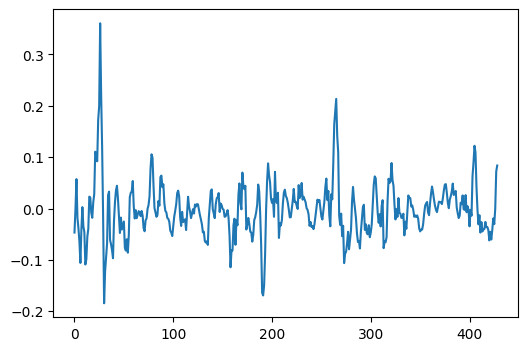

In [35]:
plt.figure(figsize=(6,4))
#codes = df['code']
#for codes in df['code']:
#    plt.plot(df[df['code'] == codes]['y'])
plt.plot(df[df['code'] == 's_0']['y'])

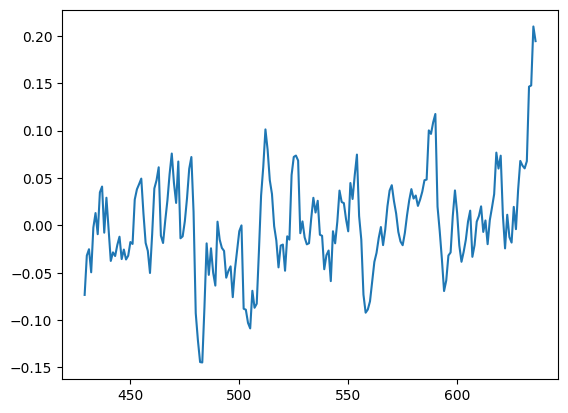

In [36]:
plt.plot(df[df['code'] == 's_1']['y'])

In [111]:
unique_dates = np.array(sorted(df["date"].unique()))

In [112]:
cut = int(math.floor(len(unique_dates) * 0.8))
cut_date = unique_dates[cut]
cut_date

Timestamp('2025-03-16 00:00:00')

In [113]:
df_t = df[df["date"] < cut_date].copy()
df_v  = df[df["date"] >= cut_date].copy()

print("Cut date:", pd.to_datetime(cut_date).date())
print("Train rows:", len(df_t), "Validation rows:", len(df_v))

Cut date: 2025-03-16
Train rows: 1906350 Validation rows: 525308


In [114]:
df_t[feature_cols].head()

,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19
0,0.394700,-0.063500,7.562500,0.0,0.048135,0.582772,0.0,1.952015,0.0,0.933833,0.0,0.0,1.452481,0.000000,0.000000,0.000000,0.130791,0.000070,-0.009330,0.0
1,0.302114,-0.039620,7.562500,0.0,0.003498,0.571028,0.0,1.718900,0.0,0.921778,0.0,0.0,1.322955,0.000000,0.000000,0.007457,0.132136,0.000037,-0.000959,0.0
2,0.210442,-0.021979,7.562500,0.0,-0.035704,0.566825,0.0,1.529921,0.0,0.915979,0.0,0.0,1.203602,0.000000,0.000000,0.017134,0.121744,0.000026,0.024070,0.0
3,0.091796,-0.014817,7.562500,0.0,-0.073599,0.562066,0.0,1.483651,0.0,0.919647,0.0,0.0,1.197761,0.000000,0.000000,0.030256,0.115516,-0.000006,0.030045,0.0
4,-0.000065,-0.010519,9.651191,0.0,-0.105692,0.548534,0.0,1.482967,0.0,0.921448,0.0,0.0,1.224910,-0.017885,-0.032768,0.040731,0.103038,-0.000039,0.023343,0.0


In [73]:
df_v.index

Index([    319,     320,     321,     322,     323,     324,     325,     326,
           327,     328,
       ...
       2431648, 2431649, 2431650, 2431651, 2431652, 2431653, 2431654, 2431655,
       2431656, 2431657],
      dtype='int64', length=525308)

In [116]:
train_df, f_cols, daily_means_train = features_def(df_t)

In [123]:
Xt_df = train_df[f_cols].dropna()

In [130]:
yt_df = train_df['y']

In [127]:
valid_df, f_cols, daily_means_valid = features_def(df_v)

In [128]:
Xv_df = valid_df[f_cols].dropna()

In [131]:
yv_df = valid_df['y']

In [148]:
X_row = Xt_df.to_numpy(dtype=np.float32)
y_row = yt_df.to_numpy(dtype=np.float32)

In [149]:
#imputing Missing Values
imp_mi = SimpleImputer(strategy="median")
X_row_imp = imp_mi.fit_transform(X_row)

In [150]:
mi_xr = X_row.copy()
mi_yr = y_row.copy()

In [151]:
np.isnan(mi_xr).any() #mi_xr.isnull().sum()

np.False_

In [48]:
from sklearn.feature_selection import SelectKBest

In [50]:
#selector = SelectKBest(score_func=mutual_info_regression, k=25)
#selector.fit(mi_xr,mi_yr)

In [43]:
#select_feaures_indixes=selector.get_support(indices=True)

In [44]:
#select_feaures_indixes

array([ 0,  2, 12, 17, 20, 21, 22, 23, 24, 25, 26, 29, 30, 33, 34])

In [52]:
#colnames = df.columns[select_feaures_indixes]
#print(colnames)

In [152]:
rng = np.random.default_rng(42)
n_sample = min(20000, X_row_imp.shape[0])
idx = rng.choice(X_row_imp.shape[0], size=n_sample, replace=False)

In [154]:
mi = mutual_info_regression(X_row_imp[idx], y_row[idx], random_state=42)
mi_series = pd.Series(mi, index=f_cols).sort_values(ascending=False)

In [156]:
TOP_K = min(25, len(f_cols))
selected_features = mi_series.head(TOP_K).index.tolist()
mi_series.head(20)

code_id          0.013934
t_idx            0.010315
f_mean           0.009971
f_3              0.005555
f_11             0.004979
y_lag3           0.004936
dow              0.004114
f_17             0.003486
f_5              0.003176
y_lag1           0.003162
f_4              0.002769
f_14             0.002682
f_7              0.001989
y_roll_mean_5    0.001405
f_std            0.001086
date_cos_365     0.000192
year             0.000167
date_cos_7       0.000152
date_sin_30      0.000124
f_range          0.000104
dtype: float64

In [216]:
#selected_features

In [159]:
X_train_row = train_df[selected_features].to_numpy(dtype=np.float32)
X_valid_row  = valid_df[selected_features].to_numpy(dtype=np.float32)

In [160]:
imp = SimpleImputer(strategy="median")
scaler = StandardScaler()

In [161]:
X_train_imp = imp.fit_transform(X_train_row)
X_valid_imp  = imp.transform(X_valid_row)

In [162]:
X_train_scaled = scaler.fit_transform(X_train_imp)
X_valid_scaled  = scaler.transform(X_valid_imp)

In [163]:
X_train_scaled.shape[1]

25

In [164]:
PCA_N = min(20, X_train_scaled.shape[1])
pca = PCA(n_components=PCA_N, random_state=42)

In [165]:
Z_train = pca.fit_transform(X_train_scaled).astype(np.float32)
Z_valid  = pca.transform(X_valid_scaled).astype(np.float32)

In [166]:
kmeans = MiniBatchKMeans(n_clusters=8, random_state=42, batch_size=4096, n_init="auto")
kmeans.fit(Z_train)

,"n_clusters n_clusters: int, default=8The number of clusters to form as well as the number ofcentroids to generate.",8
,"init init: {'k-means++', 'random'}, callable or array-like of shape (n_clusters, n_features), default='k-means++'Method for initialization:'k-means++' : selects initial cluster centroids using sampling based onan empirical probability distribution of the points' contribution to theoverall inertia. This technique speeds up convergence. The algorithmimplemented is ""greedy k-means++"". It differs from the vanilla k-means++by making several trials at each sampling step and choosing the best centroidamong them.'random': choose `n_clusters` observations (rows) at random from datafor the initial centroids.If an array is passed, it should be of shape (n_clusters, n_features)and gives the initial centers.If a callable is passed, it should take arguments X, n_clusters and arandom state and return an initialization.For an evaluation of the impact of initialization, see the example:ref:`sphx_glr_auto_examples_cluster_plot_kmeans_stability_low_dim_dense.py`.",'k-means++'
,"max_iter max_iter: int, default=100Maximum number of iterations over the complete dataset beforestopping independently of any early stopping criterion heuristics.",100
,"batch_size batch_size: int, default=1024Size of the mini batches.For faster computations, you can set `batch_size > 256 * number_of_cores`to enable :ref:`parallelism `on all cores... versionchanged:: 1.0 `batch_size` default changed from 100 to 1024.",4096
,"verbose verbose: int, default=0Verbosity mode.",0
,"compute_labels compute_labels: bool, default=TrueCompute label assignment and inertia for the complete datasetonce the minibatch optimization has converged in fit.",True
,"random_state random_state: int, RandomState instance or None, default=NoneDetermines random number generation for centroid initialization andrandom reassignment. Use an int to make the randomness deterministic.See :term:`Glossary `.",42
,"tol tol: float, default=0.0Control early stopping based on the relative center changes asmeasured by a smoothed, variance-normalized of the mean centersquared position changes. This early stopping heuristics iscloser to the one used for the batch variant of the algorithmsbut induces a slight computational and memory overhead over theinertia heuristic.To disable convergence detection based on normalized centerchange, set tol to 0.0 (default).",0.0
,"max_no_improvement max_no_improvement: int, default=10Control early stopping based on the consecutive number of minibatches that does not yield an improvement on the smoothed inertia.To disable convergence detection based on inertia, setmax_no_improvement to None.",10
,"init_size init_size: int, default=NoneNumber of samples to randomly sample for speeding up theinitialization (sometimes at the expense of accuracy): theonly algorithm is initialized by running a batch KMeans on arandom subset of the data. This needs to be larger than n_clusters.If `None`, the heuristic is `init_size = 3 * batch_size` if`3 * batch_size < n_clusters`, else `init_size = 3 * n_clusters`.",None
,"n_init n_init: 'auto' or int, default=""auto""Number of random initializations that are tried.In contrast to KMeans, the algorithm is only run once, using the best ofthe `n_init` initializations as measured by inertia. Several runs arerecommended for sparse high-dimensional problems (see:ref:`kmeans_sparse_high_dim`).When `n_init='auto'`, the number of runs depends on the value of init:3 if using `init='random'` or `init` is a callable;1 if using `init='k-means++'` or `init` is an array-like... versionadded:: 1.2 Added 'auto' option for `n_init`... versionchanged:: 1.4 Default value for `n_init` changed to `'auto'` in version.",'auto'


In [167]:
D_train = kmeans.transform(Z_train).astype(np.float32)  # distances to centers
D_valid  = kmeans.transform(Z_valid).astype(np.float32)

In [67]:
D_train

array([[11.874621 , 10.422869 , 12.344367 , ..., 12.459385 , 13.310226 ,
        12.38592  ],
       [11.317198 ,  9.895018 , 11.753285 , ..., 11.901919 , 12.713357 ,
        11.81431  ],
       [10.882619 ,  9.50218  , 11.2728615, ..., 11.46059  , 12.214427 ,
        11.359136 ],
       ...,
       [ 4.6081967,  5.562    ,  4.6808085, ...,  4.64226  ,  4.1049824,
         4.2950535],
       [ 4.7922645,  5.7081227,  4.9266815, ...,  4.7623005,  4.4056706,
         4.517005 ],
       [ 4.623038 ,  5.5286107,  4.858165 , ...,  4.5615826,  4.3889966,
         4.3949533]], shape=(1906350, 8), dtype=float32)

In [168]:
F_train = np.hstack([Z_train, D_train]).astype(np.float32)
F_valid  = np.hstack([Z_valid,  D_valid]).astype(np.float32)

print("Row feature matrix shapes:", F_train.shape, F_valid.shape)

Row feature matrix shapes: (1906350, 28) (525308, 28)


In [70]:
df_ftrain = pd.DataFrame(F_train)
df_fvalid = pd.DataFrame(F_valid)

In [71]:
df_ftrain.head()


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22
0,-5.449065,5.130941,2.465398,-0.235900,0.364163,0.965113,-0.929550,-0.291819,-2.549440,-1.840019,1.228204,-0.403127,-2.441375,8.100534,0.713971,11.874621,10.422869,12.344367,13.170129,12.886845,12.459385,13.310226,12.385920
1,-5.087369,4.701354,2.377216,-0.363964,0.487662,1.463763,-0.395853,0.613230,-2.009827,-1.921808,1.249031,-0.271701,-2.259551,7.908681,-0.244066,11.317198,9.895018,11.753285,12.595353,12.254445,11.901919,12.713357,11.814310
2,-4.728393,4.281799,2.297202,-0.511723,0.563472,1.592037,-0.091787,0.802243,-1.602168,-1.784525,1.293415,-0.145632,-2.070684,7.770021,-1.041667,10.882619,9.502180,11.272861,12.127402,11.725140,11.460590,12.214427,11.359136
3,-4.594130,4.079570,2.222747,-0.658020,0.589466,1.254034,-0.188599,0.118021,-1.482612,-2.026384,1.356118,0.108847,-2.158938,7.883276,-1.035918,10.822798,9.491137,11.176749,12.052040,11.627261,11.396814,12.106799,11.271142
4,-5.414742,4.959234,2.829867,-0.671244,0.313689,0.514996,-0.718642,-0.837522,-2.605773,-3.227036,2.854483,-0.059216,-2.616198,10.208289,-2.153582,14.075838,12.856122,14.458765,15.230756,14.803296,14.640014,15.266923,14.587021


In [72]:
df_fvalid.shape

(525308, 23)

In [74]:
#train_gen = F_train.copy()

In [73]:
#TS Generator
#n_input = 30
#n_features = 23
#generator = TimeseriesGenerator(train_gen, train_gen, length=n_input, batch_size=256)

In [76]:
#X,y = generator[0]

In [78]:
#print(f'X:{X.flatten()}')
#print(f'y:{y.flatten()}')

In [103]:
#model = Sequential()
#model.add(LSTM(64, activation='relu', input_shape=(n_input, n_features), return_sequences=True))
#model.add(LSTM(32))
#model.add(LSTM(32, activation='relu', input_shape=(n_input, n_features)))
#model.add(Dense(1))
#model.compile(optimizer='adam', loss='mse')

In [79]:
#model.summary()

In [80]:
#model.fit(generator, epochs=50)

In [81]:
train_df.head()

,code,date,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,y,code_id,t_idx,dow,dom,month,weekofyear,year,sin_7,cos_7,sin_30,cos_30,sin_90,cos_90,sin_365,cos_365
0,s_0,2024-05-01,0.394700,-0.063500,7.562500,0.0,0.048135,0.582772,0.0,1.952015,0.0,0.933833,0.0,0.0,1.452481,0.000000,0.000000,0.000000,0.130791,0.000070,-0.009330,0.0,-0.046793,0,0,2,1,5,18,2024,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000
1,s_0,2024-05-02,0.302114,-0.039620,7.562500,0.0,0.003498,0.571028,0.0,1.718900,0.0,0.921778,0.0,0.0,1.322955,0.000000,0.000000,0.007457,0.132136,0.000037,-0.000959,0.0,-0.001007,0,1,3,2,5,18,2024,0.781832,0.623490,0.207912,0.978148,0.069756,0.997564,0.017213,0.999852
2,s_0,2024-05-03,0.210442,-0.021979,7.562500,0.0,-0.035704,0.566825,0.0,1.529921,0.0,0.915979,0.0,0.0,1.203602,0.000000,0.000000,0.017134,0.121744,0.000026,0.024070,0.0,0.057230,0,2,4,3,5,18,2024,0.974928,-0.222521,0.406737,0.913545,0.139173,0.990268,0.034422,0.999407
3,s_0,2024-05-04,0.091796,-0.014817,7.562500,0.0,-0.073599,0.562066,0.0,1.483651,0.0,0.919647,0.0,0.0,1.197761,0.000000,0.000000,0.030256,0.115516,-0.000006,0.030045,0.0,-0.018251,0,3,5,4,5,18,2024,0.433884,-0.900969,0.587785,0.809017,0.207912,0.978148,0.051620,0.998667
4,s_0,2024-05-05,-0.000065,-0.010519,9.651191,0.0,-0.105692,0.548534,0.0,1.482967,0.0,0.921448,0.0,0.0,1.224910,-0.017885,-0.032768,0.040731,0.103038,-0.000039,0.023343,0.0,-0.038166,0,4,6,5,5,18,2024,-0.433884,-0.900969,0.743145,0.669131,0.275637,0.961262,0.068802,0.997630


In [170]:
SEQ_LEN = 30 

train_df = train_df.sort_values(["code","date"]).reset_index(drop=True)
test_df  = valid_df.sort_values(["code","date"]).reset_index(drop=True)

y_train_row = train_df['y'].to_numpy(dtype=np.float32)
y_valid_row  = valid_df['y'].to_numpy(dtype=np.float32)

In [171]:
def make_sequences_by_code(df_part, feats_array, y_array, seq_len=30):
    Xs, ys, meta = [], [], []
    for code, grp in df_part.groupby("code", sort=False):
        idx = grp.index.to_numpy()
        feat = feats_array[idx]
        y = y_array[idx] #if y_array is not None else None
        for i in range(seq_len, len(idx)):
            Xs.append(feat[i-seq_len:i])
#            if y is not None:
            ys.append(y[i])
            meta.append((code, grp.loc[idx[i], "date"]))
    Xs = np.asarray(Xs, dtype=np.float32)
    meta = pd.DataFrame(meta, columns=["code","date"])
#    if y_array is None:
#        return Xs, meta
    ys = np.asarray(ys, dtype=np.float32)
    return Xs, ys, meta

In [173]:
X_seq, y_seq, meta_train = make_sequences_by_code(train_df, F_train, y_train_row, seq_len=SEQ_LEN)
Xh_seq, yh_seq, meta_valid = make_sequences_by_code(valid_df, F_valid, y_valid_row, seq_len=SEQ_LEN)

print("Train sequences:", X_seq.shape, "Validation sequences:", Xh_seq.shape)

Train sequences: (1762924, 30, 28) Validation sequences: (380741, 30, 28)


In [95]:
X_seq = X_seq[sort_idx]
y_seq = y_seq[sort_idx]
meta_train = meta_train.iloc[sort_idx].reset_index(drop=True)

val_cut = int(len(X_seq) * 0.85)
X_tr, X_val = X_seq[:val_cut], X_seq[val_cut:]
y_tr, y_val = y_seq[:val_cut], y_seq[val_cut:]

print("Train/Val:", X_tr.shape, X_val.shape)

code            object
date    datetime64[ns]
dtype: object

In [96]:
meta_train = meta_train.copy()
#meta_train["date"] = pd.to_datetime(meta_train["date"])
sort_idx = np.argsort(meta_train["date"].to_numpy())

In [174]:
tf.random.set_seed(42)
np.random.seed(42)

model = models.Sequential([
    layers.Input(shape=(X_seq.shape[1], X_seq.shape[2])),
    layers.LSTM(96, return_sequences=True),
    layers.Dropout(0.25),
    layers.LSTM(48),
    layers.Dropout(0.25),
    layers.Dense(1)
])

model.compile(optimizer=optimizers.Adam(learning_rate=.006), loss="mse")

es = callbacks.EarlyStopping(patience=4, restore_best_weights=True, monitor="val_loss")

In [175]:
hist = model.fit(
    X_seq, y_seq,
    validation_data=(Xh_seq, yh_seq),
    epochs=30,
    batch_size=256,
    callbacks=[es],
    verbose=0
)

In [176]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 30, 96)              │          48,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 30, 96)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 48)                  │          27,840 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 48)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │              49 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 227,669 (889.34 KB)

 Trainable params: 75,889 (296.44 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 151,780 (592.89 KB)

In [184]:
print(hist.history.keys())

dict_keys(['loss', 'val_loss'])


In [182]:
training_loss = hist.history['loss']
print(training_loss)

[0.003082041395828128, 0.002003313275054097, 0.001965660136193037, 0.0019294869853183627, 0.0019069844856858253]


In [187]:
validation_loss = hist.history['val_loss']
print(validation_loss)

[0.001237130374647677, 0.00133127486333251, 0.0014500035904347897, 0.0014122800203040242, 0.0014523371355608106]


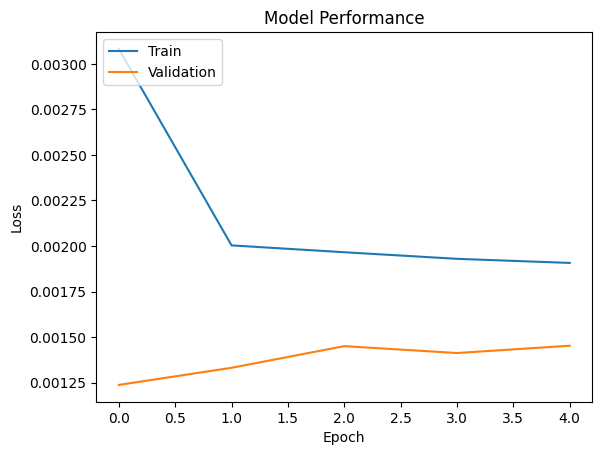

In [191]:
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model Performance')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [188]:
pred_val = model.predict(Xh_seq, verbose=0).ravel()
rmse = mean_squared_error(yh_seq, pred_val)
mae  = mean_absolute_error(yh_seq, pred_val)
#results.append({"val_rmse": float(rmse), "val_mae": float(mae), "epochs": len(hist.history["loss"])})

print("Validation RMSE:", rmse, "Validation MAE:", mae)

Validation RMSE: 0.0012371307238936424 Validation MAE: 0.025131698697805405


In [ ]:
#pd.DataFrame(results).sort_values("val_rmse")

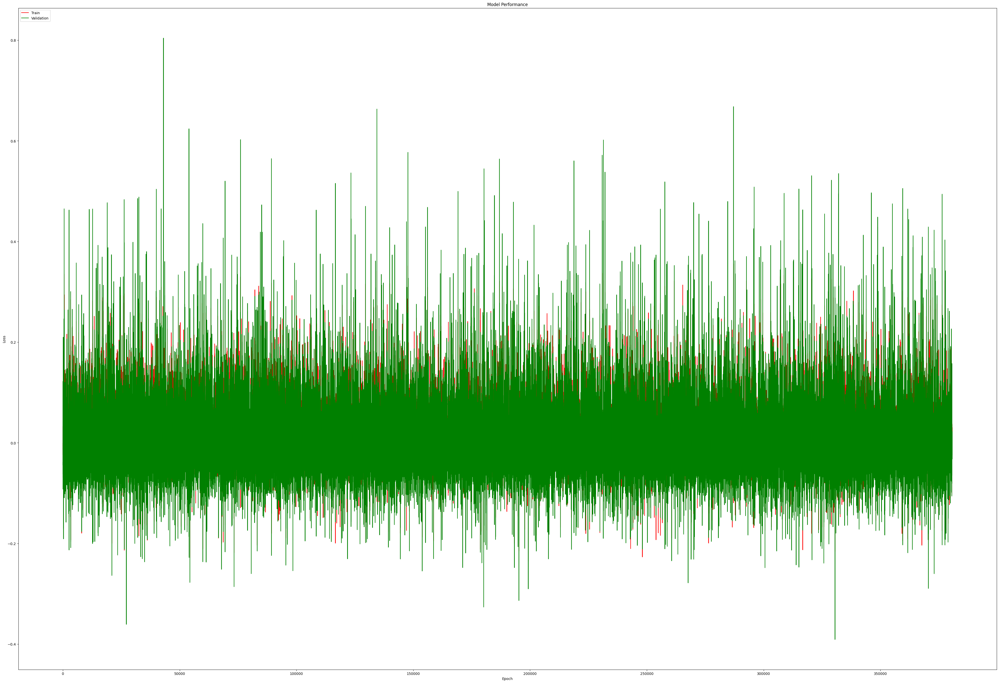

In [201]:
plt.figure(figsize=(50,34))
plt.plot(pred_val, color='red')
plt.plot(yh_seq, color='green')
plt.title('Model Performance')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [118]:
"""pred_val_df = meta_valid.copy()
pred_val_df["date"] = pd.to_datetime(pred_val_df["date"]).dt.strftime("%Y-%m-%d")
pred_val_df["y_true"] = yh_seq
pred_val_df["y_pred"] = pred_val"""

'pred_val_df = meta_valid.copy()\npred_val_df["date"] = pd.to_datetime(pred_val_df["date"]).dt.strftime("%Y-%m-%d")\npred_val_df["y_true"] = yh_seq\npred_val_df["y_pred"] = pred_val'

In [345]:
df_test = tstData.copy()

In [315]:
df_test.shape

(869269, 23)

In [346]:
df_test['date'] = pd.to_datetime(df_test['date'], unit='D', origin='2024-01-01')

In [317]:
#df_test["date"] = pd.to_datetime(df_test["date"])

In [348]:
df_test.head()

,code,date,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,y
2244974,s_4780,2025-07-04,-0.704179,0.072523,1.990935,0.820878,-0.006093,0.485911,0.040129,0.942753,2.119506,0.934240,0.081470,1.129677,0.949033,-0.058095,0.016745,0.002501,0.080117,-0.000019,-0.003881,-0.030448,-0.106038
2031851,s_2097,2025-07-04,-1.475341,-0.060034,1.737305,0.675257,0.101021,0.273800,0.003186,0.834724,2.751153,0.976950,0.003297,1.146666,0.872422,-0.089398,0.022010,-0.048870,0.016602,-0.000008,0.040727,-0.068891,-0.066604
2433999,s_2157,2025-07-04,-1.577786,0.074787,1.659307,0.696049,0.076902,0.304876,-0.016647,0.804080,3.097071,0.981946,0.015689,1.223102,0.803156,-0.053105,-0.016663,-0.046717,-0.015627,-0.000052,0.026963,0.002812,-0.011905
2402607,s_4105,2025-07-04,-1.003856,0.033389,1.360022,0.586838,-0.026944,0.450235,0.019490,0.848843,2.781379,0.958969,-0.001349,1.153103,0.940588,-0.052266,-0.015170,0.044854,-0.016701,-0.000013,0.038767,-0.031813,0.071741
1952904,s_2387,2025-07-04,-1.260005,-0.068659,2.414646,0.838523,-0.094169,0.335265,0.001841,0.893063,2.625780,0.928790,0.057546,1.016474,0.897439,-0.092461,0.021719,0.010151,0.006536,-0.000028,-0.060134,0.083079,-0.004084


In [368]:
df_test = df_test.sort_values(["code","date"]).reset_index(drop=True)

In [369]:
df_test["code_id"] = df_test["code"].astype("category").cat.codes.astype(np.int32)
df_test["t_idx"] =df_test.groupby("code").cumcount().astype(np.int32)

In [371]:
test_df, f_cols, daily_means_test = features_def(df_test)

In [372]:
test_df.head()

,code,date,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,y,code_id,t_idx,dow,dom,month,weekofyear,year,f_mean,f_std,f_min,f_max,f_range,date_sin_7,date_cos_7,date_sin_30,date_cos_30,date_sin_90,date_cos_90,date_sin_365,date_cos_365,y_lag1,y_lag2,y_lag3,y_lag5,y_roll_mean_5,y_roll_mean_20,y_roll_std_20
0,s_0,2025-07-04,-1.369722,0.039572,1.779249,0.614737,-0.156733,0.283154,0.028497,0.578046,3.074321,0.980909,0.017531,0.993053,0.722489,-0.183440,0.003627,-0.034966,-0.014534,-0.000058,0.059350,-0.003217,0.090807,0,0,4,4,7,27,2025,0.370593,0.868186,-1.369722,3.074321,4.444043,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,s_0,2025-07-05,-1.382292,0.046213,1.788899,0.588849,-0.113548,0.281461,0.028017,0.556441,3.054377,0.980679,0.006043,1.012733,0.697357,-0.177849,0.007046,-0.046088,-0.013790,-0.000067,0.035671,0.004659,0.075164,0,1,5,5,7,27,2025,0.367740,0.865905,-1.382292,3.054377,4.436668,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.090807,NaN,NaN,NaN,NaN,NaN,NaN
2,s_0,2025-07-06,-1.400969,0.040787,1.945576,0.591494,-0.072045,0.283010,0.038164,0.582346,3.121780,0.979803,0.003479,1.194460,0.721132,-0.178476,0.009262,-0.038439,-0.011187,-0.000064,0.029482,-0.010477,0.033599,0,2,6,6,7,27,2025,0.391456,0.898539,-1.400969,3.121780,4.522749,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.075164,0.090807,NaN,NaN,NaN,NaN,NaN
3,s_0,2025-07-07,-1.374383,0.045059,1.815760,0.600794,-0.066371,0.306641,0.038751,0.678451,3.087187,0.972990,0.005802,1.206392,0.775389,-0.177323,0.006861,-0.058894,-0.011347,-0.000055,0.027638,-0.011462,0.020968,0,3,0,7,7,28,2025,0.393394,0.882723,-1.374383,3.087187,4.461569,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.033599,0.075164,0.090807,NaN,0.066523,NaN,NaN
4,s_0,2025-07-08,-1.382681,0.038729,1.834345,0.601960,-0.119939,0.273871,0.026979,0.726376,3.081610,0.971104,0.001889,1.209588,0.803587,-0.183263,0.003685,-0.045593,-0.006697,-0.000054,0.029528,-0.012795,-0.006153,0,4,1,8,7,28,2025,0.392611,0.887703,-1.382681,3.081610,4.464291,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.020968,0.033599,0.075164,NaN,0.055134,NaN,NaN


In [374]:
Xtest_df = test_df[f_cols].dropna()
ytest_df = test_df['y']

In [375]:
X_test_row = test_df[selected_features].to_numpy(dtype=np.float32)
y_test_row = test_df['y'].to_numpy(dtype=np.float32)
Xtest_df = test_df[f_cols].dropna()
X_test_imp  = imp.transform(X_test_row)
X_test_scaled  = scaler.transform(X_test_imp)
Z_test  = pca.transform(X_test_scaled).astype(np.float32)
D_test  = kmeans.transform(Z_test).astype(np.float32)
F_test  = np.hstack([Z_test,  D_test]).astype(np.float32)

In [376]:
Xtest_seq, ytest_seq, meta_test = make_sequences_by_code(test_df, F_test, y_test_row, seq_len=SEQ_LEN)

In [ ]:
meta_train = meta_train.copy()
#meta_train["date"] = pd.to_datetime(meta_train["date"])
sort_idx = np.argsort(meta_train["date"].to_numpy())

In [177]:
train_df = train_df.sort_values(["code","date"]).reset_index(drop=True)

In [ ]:
#X_seq, y_seq, meta_train = make_sequences_by_code(train_df, F_train, y_train_row, seq_len=SEQ_LEN)

In [179]:
#df_tst =df_tst.sort_values(["code","date"]).reset_index(drop=True)
#Xtest_seq, ytst_seq, meta_test = make_sequences_by_code(df_tst, F_test, y_test_row, seq_len=SEQ_LEN)

In [378]:
pred_test = model.predict(Xtest_seq, verbose=0).ravel()

In [380]:
rmse = mean_squared_error(ytest_seq, pred_test)
mae  = mean_absolute_error(ytest_seq, pred_test)
#results.append({"val_rmse": float(rmse), "val_mae": float(mae), "epochs": len(hist.history["loss"])})

print("Test RMSE:", rmse, "Test MAE:", mae)

Test RMSE: 0.0012366323499009013 Test MAE: 0.024091331288218498


In [413]:
out_df = meta_test.copy()

In [414]:
out_df.head()

,code,date
0,s_0,2025-08-03
1,s_0,2025-08-04
2,s_0,2025-08-05
3,s_0,2025-08-06
4,s_0,2025-08-07


In [418]:
out_df['y_pred'] = pred_test

In [389]:
min_date=df['date'].min()

In [403]:
min_date

Timestamp('2024-01-01 00:00:00')

In [404]:
time_d = out_df['date'] - min_date

In [406]:
print(time_d.min())

580 days 00:00:00


In [407]:
days_numeric = time_d / np.timedelta64(1, 'D')

In [415]:
out_df['date'] = pd.to_numeric(days_numeric, downcast='integer')

In [419]:
out_df.head()

,code,date,y_pred
0,s_0,580,-0.000981
1,s_0,581,0.042417
2,s_0,582,0.034527
3,s_0,583,0.044746
4,s_0,584,0.018497


In [262]:
#out_df["date"] = pd.to_datetime(out_df["date"]).dt.strftime("%Y-%m-%d")

In [421]:
os.makedirs("outputs", exist_ok=True)
out_path = 'D:\py\predictions_out_test_lstm.csv'
out_df.to_csv(out_path, index=False)
print("Saved:", out_path)
out_df.head()

Saved: D:\py\predictions_out_test_lstm.csv


,code,date,y_pred
0,s_0,580,-0.000981
1,s_0,581,0.042417
2,s_0,582,0.034527
3,s_0,583,0.044746
4,s_0,584,0.018497


In [422]:

"""
out["date"] = pd.to_datetime(out["date"]).dt.strftime("%Y-%m-%d")
out["y_pred"] = pred_test

os.makedirs("outputs", exist_ok=True)
out_path = "outputs/predictions_test_lstm.csv"
out.to_csv(out_path, index=False)
print("Saved:", out_path)
out.head()
"""

'\nout["date"] = pd.to_datetime(out["date"]).dt.strftime("%Y-%m-%d")\nout["y_pred"] = pred_test\n\nos.makedirs("outputs", exist_ok=True)\nout_path = "outputs/predictions_test_lstm.csv"\nout.to_csv(out_path, index=False)\nprint("Saved:", out_path)\nout.head()\n'